<a href="https://colab.research.google.com/github/tomkart/api_nsw/blob/main/fuel_prices_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
import requests
import base64
import json
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from datetime import datetime
import pytz
from IPython.display import display, HTML
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import os
import numpy as np


In [2]:
def read_credentials(filepath):
    credentials = {}
    with open(filepath, 'r') as f:
        for line in f:
            # Check if the line contains an '=' for key-value separation
            if '=' in line:
                # Split only on the first occurrence of '='
                parts = line.strip().split('=', 1)
                # Use parts[0] as key and parts[1] as value if available, otherwise use empty string
                key = parts[0]
                value = parts[1] if len(parts) > 1 else ''
                credentials[key] = value
            else:
                # Handle lines without '=' if needed (e.g., skip or log a warning)
                print(f"Warning: Skipping line without '=' sign: {line.strip()}")
    return credentials

# Assuming your file is named "nsw_opengov_properties.txt" and in the same directory
credentials = read_credentials("nsw_opengov_properties.txt")
#credentials

# Access the credentials
# Example:
# api_key = credentials['api_key']
# username = credentials['username']
# password = credentials['password']


# Now you can use the credentials with requests library or any other library
# Example using requests library:

# response = requests.get("your_api_endpoint", auth=(username, password))



In [3]:
# Access the credentials and assign to variables
API_KEY = credentials.get('API_KEY', '')  # Use .get() to avoid KeyError if key is missing
AUTH_HEAD = credentials.get('AUTH_HEAD', '') # Use .get() to avoid KeyError if key is missing

# Print or use the variables
#print(f"API_KEY: {API_KEY}")
#print(f"AUTH_HEAD: {AUTH_HEAD}")


In [7]:
# Define Sydney timezone
sydney_tz = pytz.timezone("Australia/Sydney")

# Function to get access token
def get_access_token():
    token_url = "https://api.onegov.nsw.gov.au/oauth/client_credential/accesstoken"
    #credentials = f"{CLIENT_ID}:{CLIENT_SECRET}"
    #encoded_credentials = base64.b64encode(credentials.encode()).decode()
    encoded_credentials = AUTH_HEAD

    headers = {
        "Authorization": f"Basic {encoded_credentials}",
        "Content-Type": "application/json"
    }

    params = {
    "grant_type": "client_credentials"
    }

    try:
        #print(token_url)
        response = requests.get(token_url, headers=headers, params=params)
        return response.json().get("access_token")
    except requests.exceptions.RequestException as e:
        print(f"Token Request Failed: {e}")
        return None


token = get_access_token()
#print(token)

In [8]:
# Function to get fuel prices by postcode via API call
def get_fuel_prices():
    access_token = get_access_token()
    if not access_token:
        return None

    fuel_url = "https://api.onegov.nsw.gov.au/FuelPriceCheck/v2/fuel/prices"

    # Get current time in Sydney timezone
    sydney_time = datetime.now(sydney_tz)
    request_timestamp = sydney_time.strftime("%d/%m/%Y %I:%M:%S %p")
    transaction_id = sydney_time.strftime("%Y%m%d%H%M%S")

    headers = {
        "accept": "application/json",
        "Authorization": f"Bearer {access_token}",
        "Content-Type": "application/json; charset=utf-8",
        "apikey": API_KEY,
        "transactionid": transaction_id,
        "requesttimestamp": request_timestamp
    }

    params = {"states": "NSW"}

    try:
        response = requests.get(fuel_url, headers=headers, params=params, timeout=10)
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"Fuel Prices Request Failed: {e}")
        return None

price = get_fuel_prices()
print(price)



{'stations': [{'brandid': '', 'stationid': '', 'brand': 'United', 'code': '972', 'name': 'United Petroleum Umina', 'address': '307-313 Ocean Beach Road, UMINA BEACH NSW 2257', 'location': {'latitude': -33.511231, 'longitude': 151.318092}, 'state': 'NSW'}, {'brandid': '', 'stationid': '', 'brand': 'United', 'code': '2051', 'name': 'United Petroleum Wilberforce', 'address': '539 Wilberforce Rd, WILBERFORCE NSW 2756', 'location': {'latitude': -33.563205, 'longitude': 150.8372818}, 'state': 'NSW'}, {'brandid': '', 'stationid': '', 'brand': 'Ampol', 'code': '2117', 'name': 'Toowoon Bay Service Station', 'address': '142 Bay Rd, TOOWOON BAY NSW 2261', 'location': {'latitude': -33.360126, 'longitude': 151.497039}, 'state': 'NSW'}, {'brandid': '', 'stationid': '', 'brand': 'Metro Fuel', 'code': '2118', 'name': 'Metro Petroleum Oakflats', 'address': '80-82 Central Ave, OAK FLATS NSW 2529', 'location': {'latitude': -34.562617, 'longitude': 150.819412}, 'state': 'NSW'}, {'brandid': '', 'stationid'

In [9]:
def save_data_with_timestamp(data, filename_prefix="fuel_prices"):
    """Saves data to a file with a timestamp in the filename."""
    timestamp = datetime.now(sydney_tz).strftime("%Y%m%d_%H%M%S")
    filename = f"{filename_prefix}_{timestamp}.json"
    filepath = os.path.join("/content", filename)  # Save in /content directory

    with open(filepath, 'w') as f:
        json.dump(data, f, indent=4)
    print(f"Data saved to {filepath}")

# Example usage
if price:  # Check if price data was successfully retrieved
    save_data_with_timestamp(price)


Data saved to /content/fuel_prices_20250206_183000.json


In [10]:
# Function to match stations with their fuel prices and combine prices for each station
def match_stations_with_combined_prices(fuel_data):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No fuel prices found.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a mapping of station codes to their fuel prices
    station_prices = {}
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations:
            if station_code not in station_prices:
                station_prices[station_code] = []
            station_prices[station_code].append(f"{price_entry['fueltype']}: {price_entry['price']}¢/L")

    # Merge station details with their prices
    matched_stations = []
    for station_code, station in stations.items():
        if station_code in station_prices:  # Only include stations with prices
            matched_stations.append({
                "Brand": station.get("brand", "Unknown"),
                "Name": station.get("name", "Unknown"),
                "Address": station.get("address", "Unknown"),
                "Prices": "<br>".join(station_prices[station_code]),  # Combine prices into a single string
                "Latitude": station.get("location", {}).get("latitude"),
                "Longitude": station.get("location", {}).get("longitude"),
            })

    if not matched_stations:
        print("No stations with valid prices available.")
        return None

    df = pd.DataFrame(matched_stations)

    # Display as an HTML table in Jupyter Notebook
    display(HTML(df.to_html(index=False)))
    return df

# Function to plot only stations with combined prices on a map
def display_fuel_map_combined_prices(fuel_data):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No locations to map.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a mapping of station codes to their fuel prices
    station_prices = {}
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations:
            if station_code not in station_prices:
                station_prices[station_code] = []
            station_prices[station_code].append(f"{price_entry['fueltype']}: {price_entry['price']}¢/L")

    # Merge station details with their prices
    matched_stations = []
    for station_code, station in stations.items():
        if station_code in station_prices:  # Only include stations with prices
            matched_stations.append({
                "Brand": station.get("brand", "Unknown"),
                "Name": station.get("name", "Unknown"),
                "Address": station.get("address", "Unknown"),
                "Prices": "<br>".join(station_prices[station_code]),  # Combine prices into a single string
                "Latitude": station.get("location", {}).get("latitude"),
                "Longitude": station.get("location", {}).get("longitude"),
            })

    if not matched_stations:
        print("No stations with valid prices available for mapping.")
        return None

    # Initialize the map centered around Sydney
    fuel_map = folium.Map(location=[-33.8688, 151.2093], zoom_start=12)

    # Use MarkerCluster to group nearby stations
    marker_cluster = MarkerCluster().add_to(fuel_map)

    for station in matched_stations:
        lat, lon = station["Latitude"], station["Longitude"]
        brand, address, prices = station["Brand"], station["Address"], station["Prices"]

        if lat and lon:
            popup_text = f"""
                <b>{brand} - {station['Name']}</b><br>
                Address: {address}<br>
                Prices:<br>{prices}
            """
            folium.Marker(
                location=[lat, lon],
                popup=popup_text,
                tooltip=f"{brand} - Multiple Prices"
            ).add_to(marker_cluster)

    return fuel_map



In [11]:
fuel_data = get_fuel_prices()

if fuel_data:
    df_combined_prices = match_stations_with_combined_prices(fuel_data)
    fuel_map_combined_prices = display_fuel_map_combined_prices(fuel_data)

    if fuel_map_combined_prices:
        display(fuel_map_combined_prices)
else:
    print("No fuel data available.")

Brand,Name,Address,Prices,Latitude,Longitude
United,United Petroleum Umina,"307-313 Ocean Beach Road, UMINA BEACH NSW 2257",DL: 199.9¢/L<br>E10: 196.5¢/L<br>E85: 219.9¢/L<br>P95: 212.5¢/L<br>P98: 219.5¢/L<br>PDL: 201.9¢/L<br>U91: 198.5¢/L,-33.511231,151.318092
United,United Petroleum Wilberforce,"539 Wilberforce Rd, WILBERFORCE NSW 2756",DL: 195.9¢/L<br>E10: 197.9¢/L<br>LPG: 108.5¢/L<br>P95: 213.9¢/L<br>P98: 220.9¢/L<br>U91: 199.9¢/L,-33.563205,150.837282
Ampol,Toowoon Bay Service Station,"142 Bay Rd, TOOWOON BAY NSW 2261",DL: 199.9¢/L<br>P95: 189.9¢/L,-33.360126,151.497039
Metro Fuel,Metro Petroleum Oakflats,"80-82 Central Ave, OAK FLATS NSW 2529",E10: 178.9¢/L<br>P98: 201.9¢/L<br>PDL: 185.9¢/L<br>U91: 180.7¢/L,-34.562617,150.819412
Ampol,Ampol Foodary Brunswick Heads Rh,"5 Tweed St, BRUNSWICK HEADS NSW 2483",E10: 186.9¢/L<br>P95: 203.9¢/L<br>P98: 211.9¢/L<br>PDL: 193.9¢/L<br>U91: 188.9¢/L,-28.538168,153.548694
Ampol,Ampol Foodary Lambton,"422 Newcastle Road, NORTH LAMBTON NSW 2299",E10: 197.9¢/L<br>P95: 214.9¢/L<br>P98: 222.9¢/L<br>PDL: 205.9¢/L<br>U91: 199.9¢/L,-32.909559,151.710968
Ampol,Ampol Nyngan,"39 Pangee St, NYNGAN NSW 2825",DL: 191.9¢/L<br>P98: 203.9¢/L<br>U91: 181.9¢/L,-31.560944,147.191497
EG Ampol,EG Ampol West Ryde,"924 Victoria Rd, WEST RYDE NSW 2114",E10: 179.7¢/L<br>P95: 194.7¢/L<br>P98: 202.7¢/L<br>PDL: 191.9¢/L<br>U91: 181.7¢/L,-33.810887,151.093485
Ampol,TASCO Leeton Vance Rd,"44-46 Vance Rd, LEETON NSW 2705",DL: 190.9¢/L,-34.543810,146.387014
Transwest Fuels,Transwest Fuels,"286 Manilla St, MANILLA NSW 2346",DL: 189.9¢/L<br>P95: 198.9¢/L<br>U91: 188.9¢/L,-30.739713,150.716288


In [12]:
# Function to match stations with their fuel prices, filtering by postcode in the address
def match_stations_with_combined_prices_filtered(postcode, fuel_data):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No fuel prices found.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a mapping of station codes to their fuel prices
    station_prices = {}
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations:
            if station_code not in station_prices:
                station_prices[station_code] = []
            station_prices[station_code].append(f"{price_entry['fueltype']}: {price_entry['price']}¢/L")

    # Merge station details with their prices and filter by postcode in address
    matched_stations = []
    for station_code, station in stations.items():
        if station_code in station_prices and postcode in station["address"]:  # Filter by postcode in address
            matched_stations.append({
                "Brand": station.get("brand", "Unknown"),
                "Name": station.get("name", "Unknown"),
                "Address": station.get("address", "Unknown"),
                "Prices": "<br>".join(station_prices[station_code]),  # Combine prices into a single string
                "Latitude": station.get("location", {}).get("latitude"),
                "Longitude": station.get("location", {}).get("longitude"),
            })

    if not matched_stations:
        print(f"No stations found in postcode {postcode} with valid prices.")
        return None

    df_filtered = pd.DataFrame(matched_stations)

    # Display as an HTML table in Jupyter Notebook
    display(HTML(df_filtered.to_html(index=False)))
    return df_filtered

# Example usage with postcode filtering
postcode_filter = "2022"  # Example postcode (Bondi Junction)
df_filtered_prices = match_stations_with_combined_prices_filtered(postcode_filter, fuel_data)


Brand,Name,Address,Prices,Latitude,Longitude
Chargefox,Mill Hill Centre,"31 Spring St, Bondi Junction NSW 2022",EV: 0¢/L,-33.892476,151.246129
ChargePoint,Westfield Bondi Junction - Car Park P3,"13 Waverley St, Bondi Junction NSW 2022",EV: 0¢/L,-33.893053,151.251264
Tesla,Westfield Bondi Junction - Car Park P4 (Valet),"500 Oxford St, Bondi Junction NSW 2022",EV: 0¢/L,-33.891570,151.250501
ChargePoint,Westfield Bondi Junction - Valet Parking,"500 Oxford St, Bondi Junction NSW 2022",EV: 0¢/L,-33.891570,151.250601
Exploren,"Intellihub - Bronte Road, Waverley","137 Bronte Rd, Queens Park NSW 2022",EV: 0¢/L,-33.897159,151.251344
Exploren,"Intellihub - Queens Park Road, Queens Park","66 Queens Park Rd, Queens Park NSW 2022",EV: 0¢/L,-33.899095,151.248110
Reddy Express,Shell Reddy Express Bondi Junction,"120-138 Birrell Street, Bondi Junction NSW 2022",DL: 197.9¢/L<br>E10: 205.9¢/L<br>P95: 225.9¢/L<br>P98: 234.9¢/L<br>U91: 207.9¢/L,-33.895583,151.248617


In [13]:

# Function to plot only stations with combined prices on a map, filtering by postcode
def display_fuel_map_combined_prices_filtered(postcode, fuel_data):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No locations to map.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a mapping of station codes to their fuel prices
    station_prices = {}
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations:
            if station_code not in station_prices:
                station_prices[station_code] = []
            station_prices[station_code].append(f"{price_entry['fueltype']}: {price_entry['price']}¢/L")

    # Merge station details with their prices and filter by postcode in address
    matched_stations = []
    for station_code, station in stations.items():
        if station_code in station_prices and postcode in station["address"]:  # Filter by postcode in address
            matched_stations.append({
                "Brand": station.get("brand", "Unknown"),
                "Name": station.get("name", "Unknown"),
                "Address": station.get("address", "Unknown"),
                "Prices": "<br>".join(station_prices[station_code]),  # Combine prices into a single string
                "Latitude": station.get("location", {}).get("latitude"),
                "Longitude": station.get("location", {}).get("longitude"),
            })

    if not matched_stations:
        print(f"No stations found in postcode {postcode} with valid prices.")
        return None
    print(matched_stations)
    # Initialize the map centered around Sydney
    fuel_map = folium.Map(location=[-33.8688, 151.2093], zoom_start=12)

    # Use MarkerCluster to group nearby stations
    marker_cluster = MarkerCluster().add_to(fuel_map)

    for station in matched_stations:
        lat, lon = station["Latitude"], station["Longitude"]
        brand, address, prices = station["Brand"], station["Address"], station["Prices"]

        if lat and lon:
            popup_text = f"""
                <b>{brand} - {station['Name']}</b><br>
                Address: {address}<br>
                Prices:<br>{prices}
            """
            folium.Marker(
                location=[lat, lon],
                popup=popup_text,
                tooltip=f"{brand} - Multiple Prices"
            ).add_to(marker_cluster)

    return fuel_map

# Example usage with postcode filtering
postcode_filter = "2022"  # Example postcode (Bondi Junction)
fuel_map_filtered = display_fuel_map_combined_prices_filtered(postcode_filter, fuel_data)

if fuel_map_filtered:
    display(fuel_map_filtered)


[{'Brand': 'Chargefox', 'Name': 'Mill Hill Centre', 'Address': '31 Spring St, Bondi Junction NSW 2022', 'Prices': 'EV: 0¢/L', 'Latitude': -33.8924759, 'Longitude': 151.2461293}, {'Brand': 'ChargePoint', 'Name': 'Westfield Bondi Junction - Car Park P3', 'Address': '13 Waverley St, Bondi Junction NSW 2022', 'Prices': 'EV: 0¢/L', 'Latitude': -33.8930533, 'Longitude': 151.2512645}, {'Brand': 'Tesla', 'Name': 'Westfield Bondi Junction - Car Park P4 (Valet)', 'Address': '500 Oxford St, Bondi Junction NSW 2022', 'Prices': 'EV: 0¢/L', 'Latitude': -33.8915695, 'Longitude': 151.2505012}, {'Brand': 'ChargePoint', 'Name': 'Westfield Bondi Junction - Valet Parking', 'Address': '500 Oxford St, Bondi Junction NSW 2022', 'Prices': 'EV: 0¢/L', 'Latitude': -33.8915695, 'Longitude': 151.2506012}, {'Brand': 'Exploren', 'Name': 'Intellihub -  Bronte Road, Waverley', 'Address': '137 Bronte Rd, Queens Park NSW 2022', 'Prices': 'EV: 0¢/L', 'Latitude': -33.8971591, 'Longitude': 151.2513438}, {'Brand': 'Explore

Skipping fuel type B20 due to insufficient data.


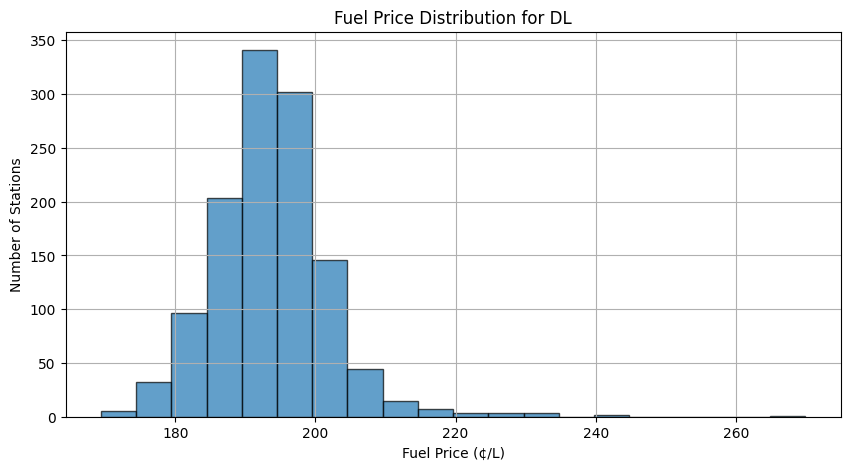

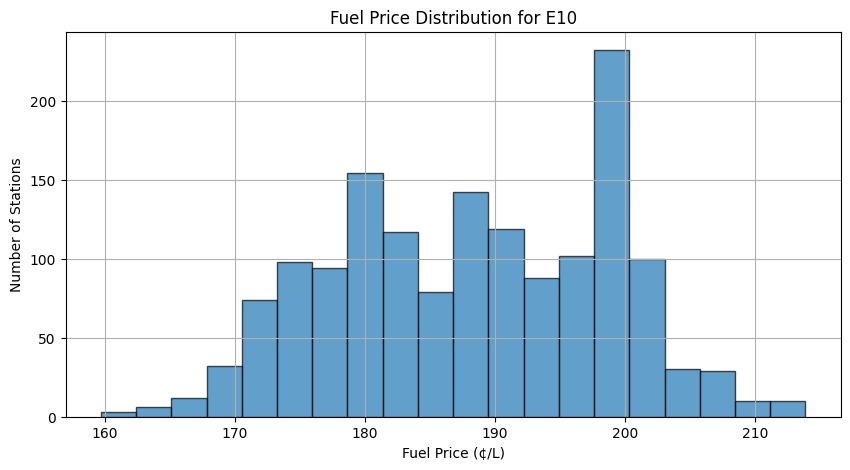

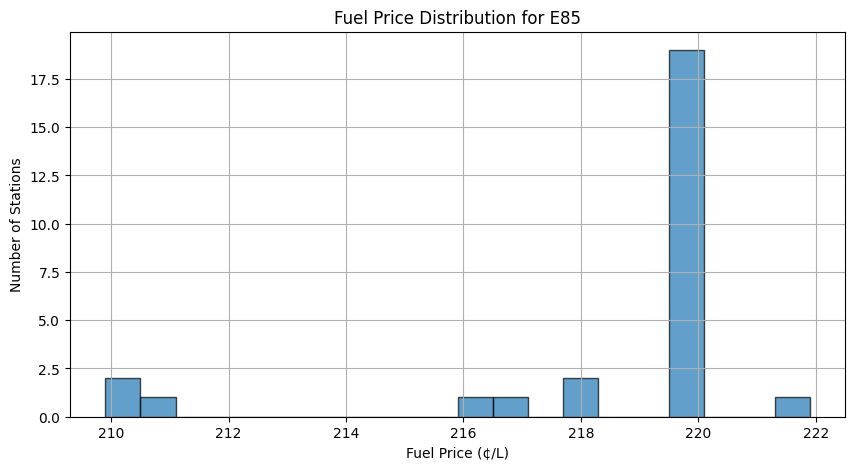

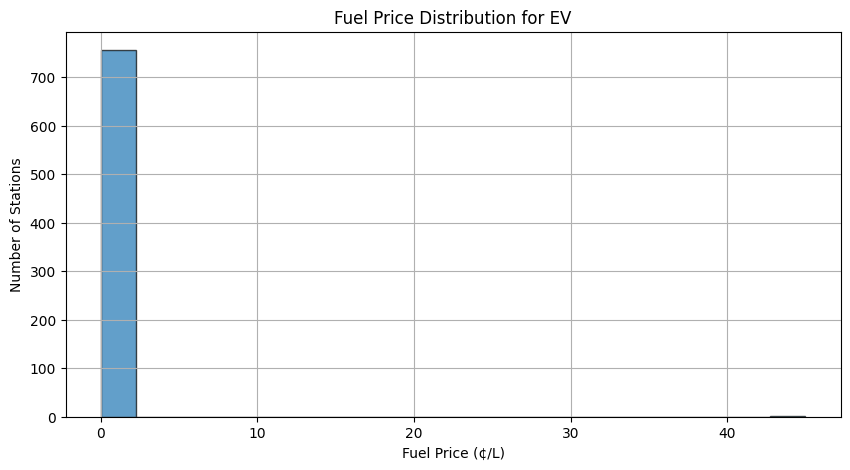

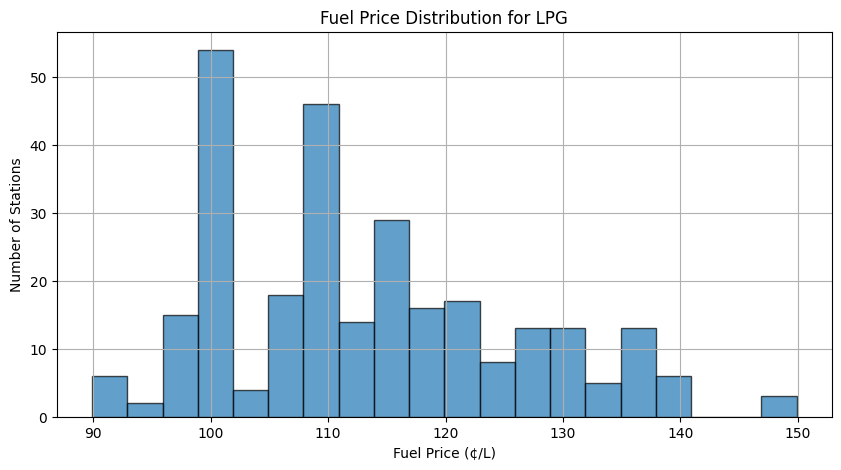

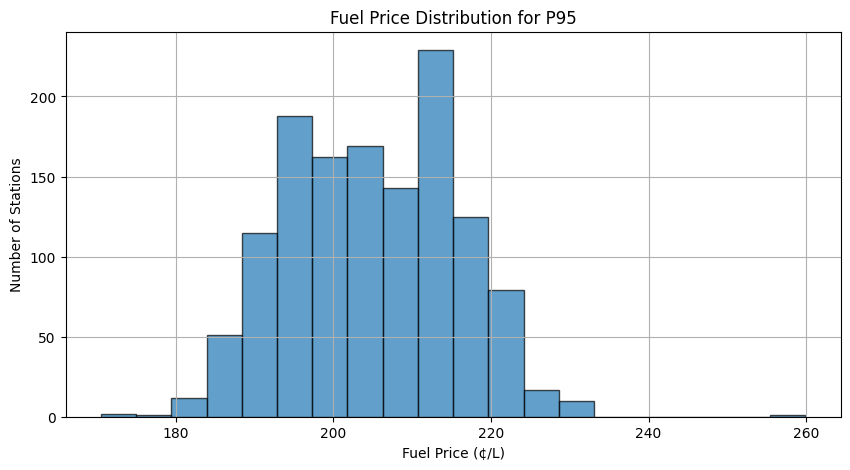

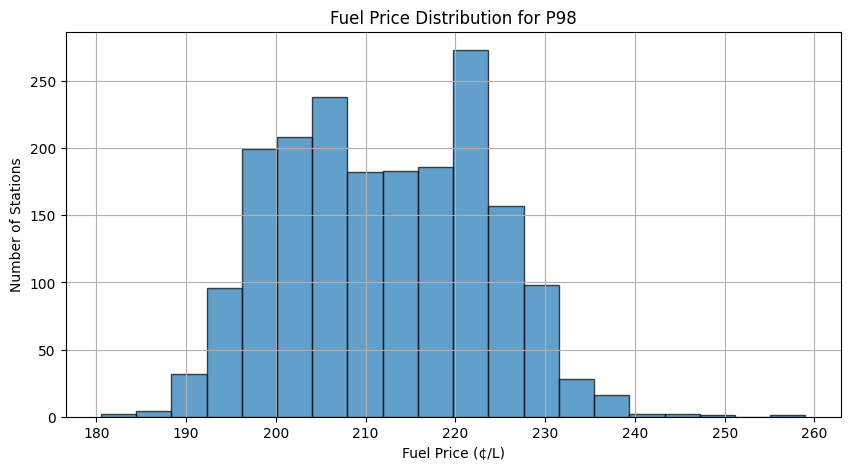

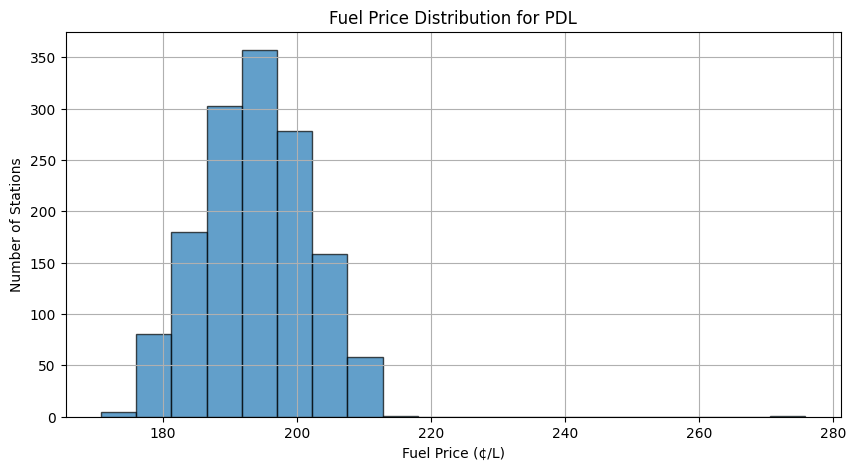

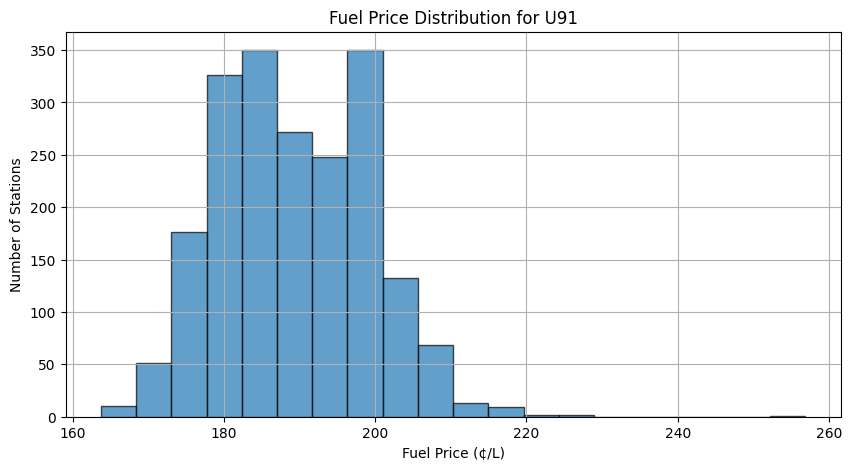

In [16]:
# Function to analyze fuel data using (Clustering & Price Distribution) with fuel type separation
def analyze_fuel_data_by_type(fuel_data):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No fuel data available for analysis.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a list to store station details along with fuel type and price
    station_prices = []
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations:
            station = stations[station_code]
            latitude = station.get("location", {}).get("latitude")
            longitude = station.get("location", {}).get("longitude")
            price = price_entry["price"]
            fuel_type = price_entry["fueltype"]

            if latitude and longitude:
                station_prices.append([latitude, longitude, price, fuel_type])

    if not station_prices:
        print("No stations with valid prices available for analysis.")
        return None

    # Convert to NumPy array for AI processing
    station_prices_array = np.array(station_prices, dtype=object)

    # Extract unique fuel types
    fuel_types = np.unique(station_prices_array[:, 3])

    # Store clustered results
    clustered_dfs = {}

    # Iterate through each fuel type and apply AI analysis
    for fuel_type in fuel_types:
        # Filter data for the specific fuel type
        fuel_type_data = station_prices_array[station_prices_array[:, 3] == fuel_type]

        if len(fuel_type_data) < 3:
            print(f"Skipping fuel type {fuel_type} due to insufficient data.")
            continue

        # Extract features for clustering (Latitude, Longitude, Price)
        X = fuel_type_data[:, :3].astype(float)

        # Apply KMeans Clustering to group fuel stations based on price and location
        kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(X)

        # Assign clusters to the data
        fuel_type_data = np.column_stack((fuel_type_data, clusters))

        # Convert back to DataFrame for analysis
        df_fuel_type = pd.DataFrame(fuel_type_data, columns=["Latitude", "Longitude", "Price", "Fuel Type", "Cluster"])

        # Store the DataFrame
        clustered_dfs[fuel_type] = df_fuel_type

        # Display results
        #print(f"\n### Analysis for Fuel Type: {fuel_type} ###")
        #display(HTML(df_fuel_type.to_html(index=False)))

        # Plot Fuel Price Distribution
        plt.figure(figsize=(10, 5))
        plt.hist(df_fuel_type["Price"].astype(float), bins=20, edgecolor='black', alpha=0.7)
        plt.xlabel("Fuel Price (¢/L)")
        plt.ylabel("Number of Stations")
        plt.title(f"Fuel Price Distribution for {fuel_type}")
        plt.grid(True)
        plt.show()

    return clustered_dfs

# Run AI analysis on the fuel data, separating by fuel type
df_fuel_analysis_by_type = analyze_fuel_data_by_type(fuel_data)


In [17]:
# Function to find the cheapest fuel stations for a specific fuel type
def find_cheapest_fuel_stations(fuel_data, fuel_type):
    if not fuel_data or "stations" not in fuel_data or "prices" not in fuel_data:
        print("No fuel data available for analysis.")
        return None

    # Create a mapping of station codes to their details
    stations = {str(station["code"]): station for station in fuel_data["stations"]}

    # Create a list to store station details along with price
    station_prices = []
    for price_entry in fuel_data["prices"]:
        station_code = str(price_entry["stationcode"])
        if station_code in stations and price_entry["fueltype"] == fuel_type:
            station = stations[station_code]
            latitude = station.get("location", {}).get("latitude")
            longitude = station.get("location", {}).get("longitude")
            price = price_entry["price"]
            postcode = station.get("address", "").split()[-1]  # Extract postcode from address

            # Filter out zero prices and missing location data
            if latitude and longitude and price > 0:
                station_prices.append([price, postcode, station["brand"], station["name"], station["address"], latitude, longitude])

    if not station_prices:
        print(f"No stations with valid prices available for fuel type {fuel_type}.")
        return None

    # Convert to DataFrame for sorting
    df_cheapest = pd.DataFrame(station_prices, columns=["Price", "Postcode", "Brand", "Name", "Address", "Latitude", "Longitude"])

    # Sort by price (ascending) and then by postcode
    df_cheapest = df_cheapest.sort_values(by=["Price", "Postcode"], ascending=[True, True])

    # Display cheapest stations
    display(HTML(df_cheapest.to_html(index=False)))

    return df_cheapest

# Example usage with fuel type filter
fuel_type_example = "P95"  # Example fuel type
df_cheapest_fuel = find_cheapest_fuel_stations(fuel_data, fuel_type_example)



Price,Postcode,Brand,Name,Address,Latitude,Longitude
170.5,2560,Independent,Apex Petroleum Airds,"60 Riverside, Airds NSW 2560",-34.085854,150.828687
174.9,2640,Independent,Independent Albury,"997 Mate Street, Albury NSW 2640",-36.057341,146.932141
176.5,2747,Metro Fuel,Metro Werrington,"569 GREAT WESTERN HWY, WERRINGTON NSW 2747",-33.768067,150.758376
180.5,2830,Liberty,Liberty Brocklehurst,"4 BURRAWAY RD, BROCKLEHURST NSW 2830",-32.180933,148.621370
180.7,2163,Independent,APEX PETROLEUM VILLAWOOD,"896A Woodville Rd, Villawood NSW 2163",-33.883891,150.976027
180.9,2650,Independent,APCO IGA Wagga,"101 Hammond Avenue, Wagga Wagga NSW 2650",-35.121445,147.389021
182.9,2446,Pearl Energy,PEARL ENERGY WAUCHOPE,"232 HIGH ST, WAUCHOPE NSW 2446",-31.468630,152.716237
182.9,2527,7-Eleven,7-Eleven Albion Park Rail,"138-142 Princes Highway, ALBION PARK RAIL NSW 2527",-34.559031,150.793658
182.9,2527,7-Eleven,7-Eleven Albion Park Rail,"47-57 Princess Highway, ALBION PARK RAIL NSW 2527",-34.552962,150.788927
183.5,2333,Mobil,Mobil Muswellbrook North,"147 BRIDGE ST, MUSWELLBROOK NSW 2333",-32.259123,150.890276


In [18]:
# Function to plot cheapest fuel stations on a map with color-coded markers
def display_cheapest_fuel_map(df_cheapest):
    if df_cheapest is None or df_cheapest.empty:
        print("No fuel data available for mapping.")
        return None

    # Initialize the map centered around Sydney
    fuel_map = folium.Map(location=[-33.8688, 151.2093], zoom_start=12)

    # Define price range for color scaling
    min_price = df_cheapest["Price"].min()
    max_price = df_cheapest["Price"].max()

    # Function to determine marker color based on price
    def get_marker_color(price):
        normalized = (price - min_price) / (max_price - min_price)  # Normalize price range
        if normalized <= 0.33:
            return "green"  # Cheapest prices
        elif normalized <= 0.66:
            return "orange"  # Mid-range prices
        else:
            return "red"  # Most expensive prices

    # Use MarkerCluster to group nearby stations
    marker_cluster = MarkerCluster().add_to(fuel_map)

    for _, row in df_cheapest.iterrows():
        lat, lon = row["Latitude"], row["Longitude"]
        brand, address, price = row["Brand"], row["Address"], row["Price"]
        color = get_marker_color(price)

        popup_text = f"""
            <b>{brand} - {row['Name']}</b><br>
            Address: {address}<br>
            Price: {price}¢/L
        """
        folium.Marker(
            location=[lat, lon],
            popup=popup_text,
            tooltip=f"{brand} - {price}¢/L",
            icon=folium.Icon(color=color)
        ).add_to(marker_cluster)

    return fuel_map

# Display the cheapest fuel stations on a color-coded map
if 'df_cheapest_fuel' in locals() and df_cheapest_fuel is not None:
    fuel_map_cheapest = display_cheapest_fuel_map(df_cheapest_fuel)
    display(fuel_map_cheapest)
else:
    print("No cheapest fuel data available to plot.")
